In [1]:
%matplotlib inline

import os
import sys

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from scipy.signal import find_peaks
from scipy import interpolate

from rascal.calibrator import Calibrator
from rascal.atlas import Atlas
from rascal import util

In [2]:
# All pixel values here are unbinned
# n for north
# s for south
hamamatsu_width = 2048

# chip gaps
hamamatsu_n_gap = 67
hamamatsu_s_gap = 61

def create_pixel_array(northsouth, binning):
    '''
    The GMOS longslit spectrum spreads over three CCDs. This function creates
    the pixel list corresponding the binned pixels adjusted for the chip gaps,
    which can lead to a non-integer shift in the number of pixels.
    Parameters
    ----------
    northsout: str
        Indicate whether the Gemini north or south, because the chip gaps are
        different.
    binning : numeric
        The binning factor
    Returns
    -------
    pixels: numpy.array
        The pixel values adjusted for chip gaps for the corresponding pixel.
    '''

    binned_width = hamamatsu_width / binning

    if northsouth == 'north':
        gap_binned_width = hamamatsu_n_gap / binning
    elif northsouth == 'south':
        gap_binned_width = hamamatsu_s_gap / binning
    else:
        raise ValueError('Please choose from "north" or "south".')

    pixels = np.concatenate(
        (np.arange(binned_width),
         np.arange(binned_width + gap_binned_width,
                   binned_width * 2 + gap_binned_width),
         np.arange(binned_width * 2 + gap_binned_width * 2,
                   binned_width * 3 + gap_binned_width * 2)))

    return pixels


pixels = create_pixel_array('north', 2)
rawpix_to_pix_itp = interpolate.interp1d(np.arange(len(pixels)), pixels)

In [3]:
# Load the data
base_dir = os.path.dirname('.')
spectrum2D = fits.open(
    os.path.join(base_dir,
                 'data_gemini_gmos/N20181115S0215_flattened.fits'))[0].data

# Collapse into 1D spectrum between row 300 and 310
spectrum = np.median(spectrum2D[300:310], axis=0)[::-1]

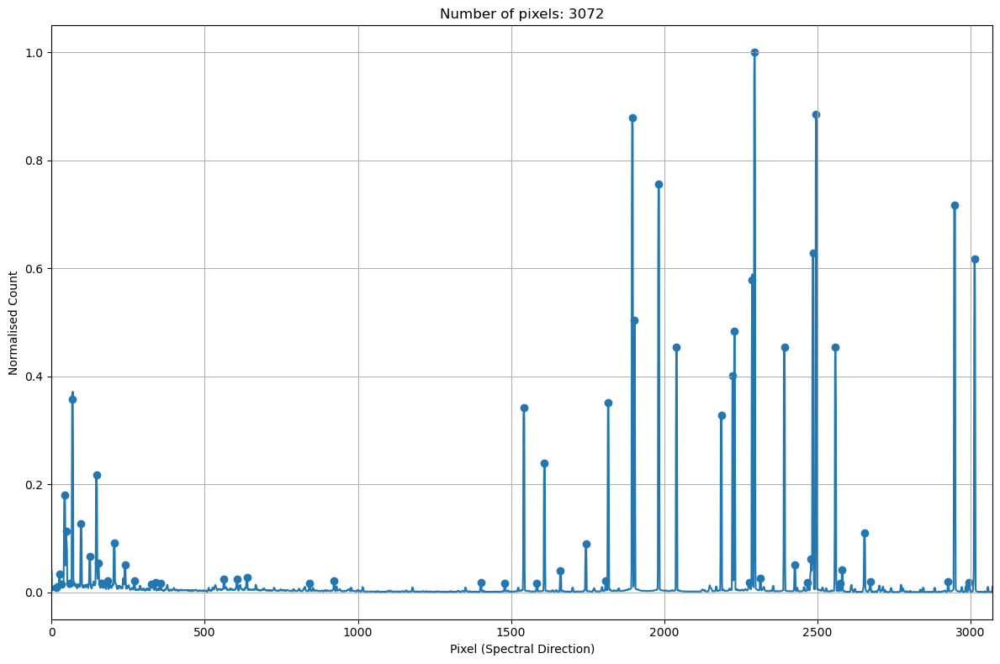

In [4]:
# Identify the peaks
peaks, _ = find_peaks(spectrum,
                      height=1000,
                      prominence=500,
                      distance=5,
                      threshold=None)
peaks = util.refine_peaks(spectrum, peaks, window_width=3)

# Shift the peaks to account of the chip-gap
peaks_effective = rawpix_to_pix_itp(peaks)

plt.figure(1, figsize=(12, 8))
plt.clf()
plt.plot(pixels, spectrum / spectrum.max())
plt.scatter(peaks_effective, spectrum[peaks.astype('int')] / spectrum.max())
plt.title('Number of pixels: ' + str(spectrum.shape[0]))
plt.xlabel("Pixel (Spectral Direction)")
plt.ylabel("Normalised Count")
plt.xlim(0, 3072)
plt.grid()
plt.tight_layout()

In [5]:
# Vacuum wavelengths
# blend: 5143.21509, 5146.74143
# something weird near there, so not used: 8008.359, 8016.990
atlas_lines = [
    4703.632, 4728.19041, 4766.19677, 4807.36348, 4849.16386, 4881.22627,
    4890.40721, 4906.12088, 4934.58593, 4966.46490, 5018.56194, 5063.44827,
    5163.723, 5189.191, 5497.401, 5560.246, 5608.290, 5913.723, 6754.698,
    6873.185, 6967.352, 7032.190, 7069.167, 7149.012, 7274.940, 7386.014,
    7505.935, 7516.721, 7637.208, 7725.887, 7893.246, 7950.362, 8105.921,
    8117.542, 8266.794, 8410.521, 8426.963, 8523.783, 8670.325, 9125.471,
    9197.161, 9227.03, 9356.787, 9660.435, 9787.186
]

element = ['CuAr'] * len(atlas_lines)

atlas = Atlas(range_tolerance=500)
atlas.add_user_atlas(
    elements=element,
    wavelengths=atlas_lines,
    vacuum=True,
    pressure=61700.0,
    temperature=276.55,
    relative_humidity=4.0,
)

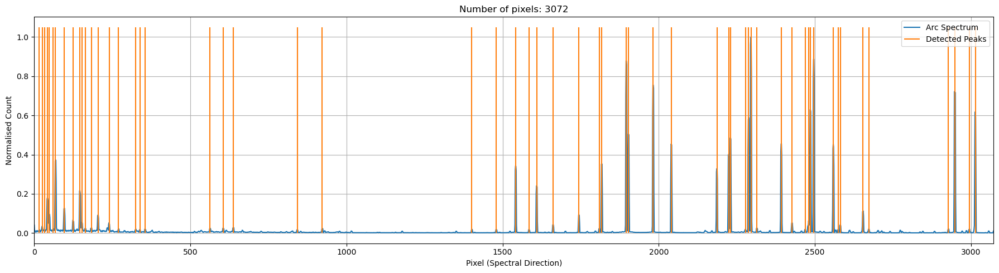

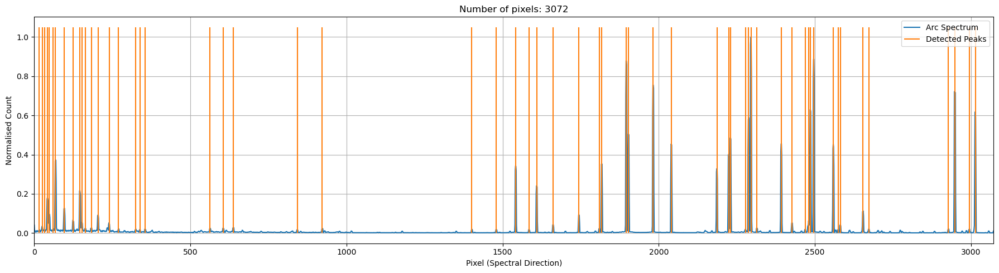

In [6]:
# Initialise the calibrator, note that it is peaks_effective being parsed in, not peaks
c = Calibrator(peaks, spectrum=spectrum)
c.set_calibrator_properties(effective_pixel=pixels)
c.plot_arc()

In [7]:
c.use_plotly()
c.plot_arc(renderer='notebook')
c.use_matplotlib()

In [8]:
c.set_atlas(atlas, candidate_tolerance=5.0)
c.set_hough_properties(num_slopes=2000,
                       range_tolerance=250.,
                       xbins=100,
                       ybins=100,
                       min_wavelength=4600.,
                       max_wavelength=9500.)
c.set_ransac_properties(sample_size=8, top_n_candidate=8, minimum_matches=40)
c.do_hough_transform()

0it [00:00, ?it/s]

C:\Users\cylam\git\rascal\src\rascal\plotting.py:766: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



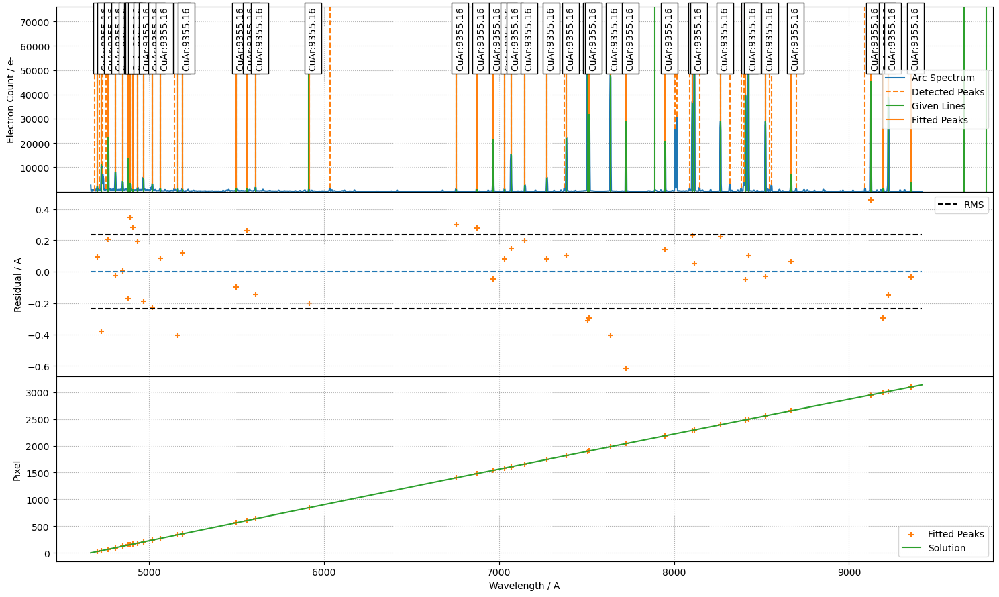

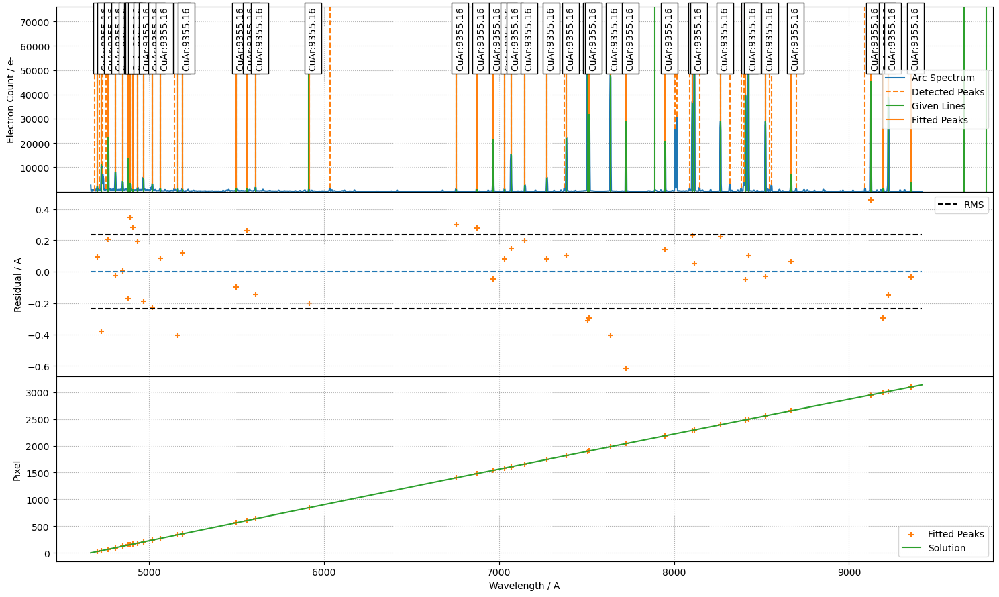

In [9]:
# Run the wavelength calibration
(
    best_p,
    matched_peaks,
    matched_atlas,
    rms,
    residual,
    peak_utilisation,
    atlas_utilisation,
    success
) = c.fit(max_tries=2000, fit_deg=4).values()

# Plot the solution
c.plot_fit(best_p, plot_atlas=True, log_spectrum=False)

In [10]:
c.use_plotly()
c.plot_fit(best_p, plot_atlas=True, log_spectrum=False, renderer='notebook')
c.use_matplotlib()

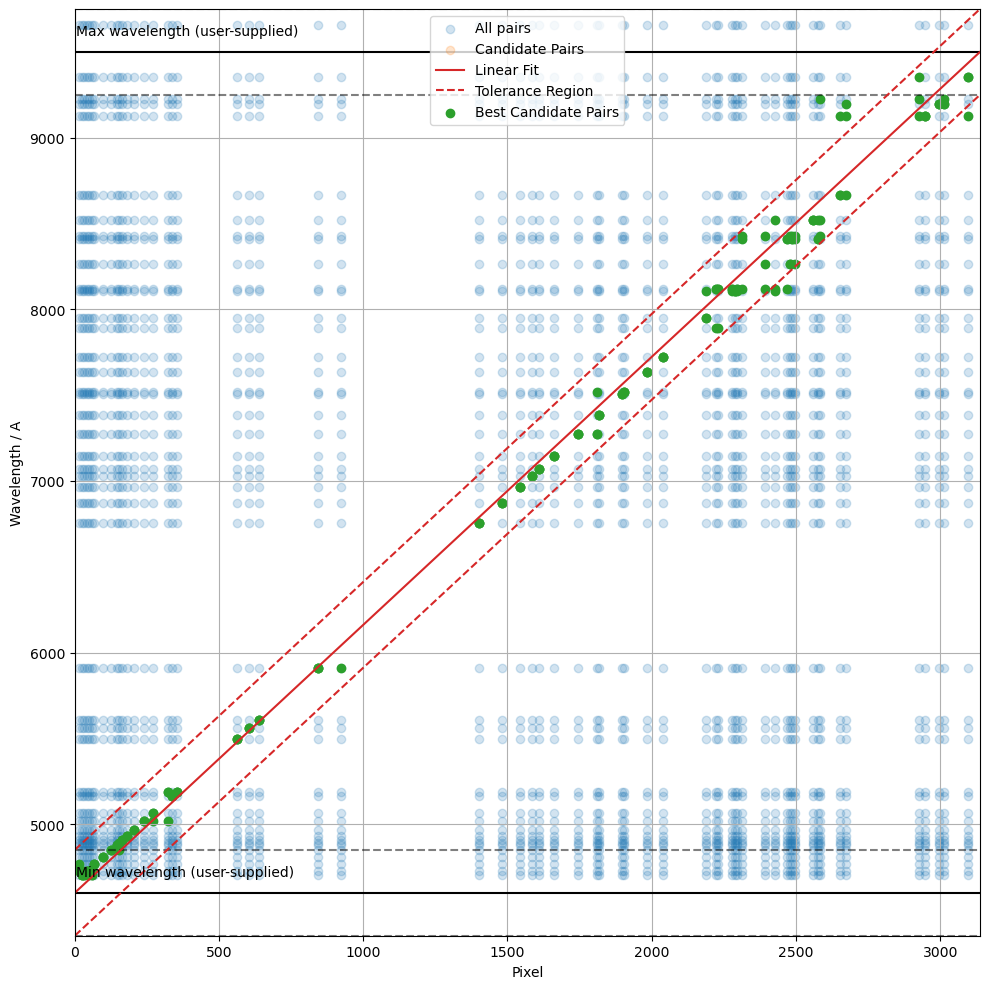

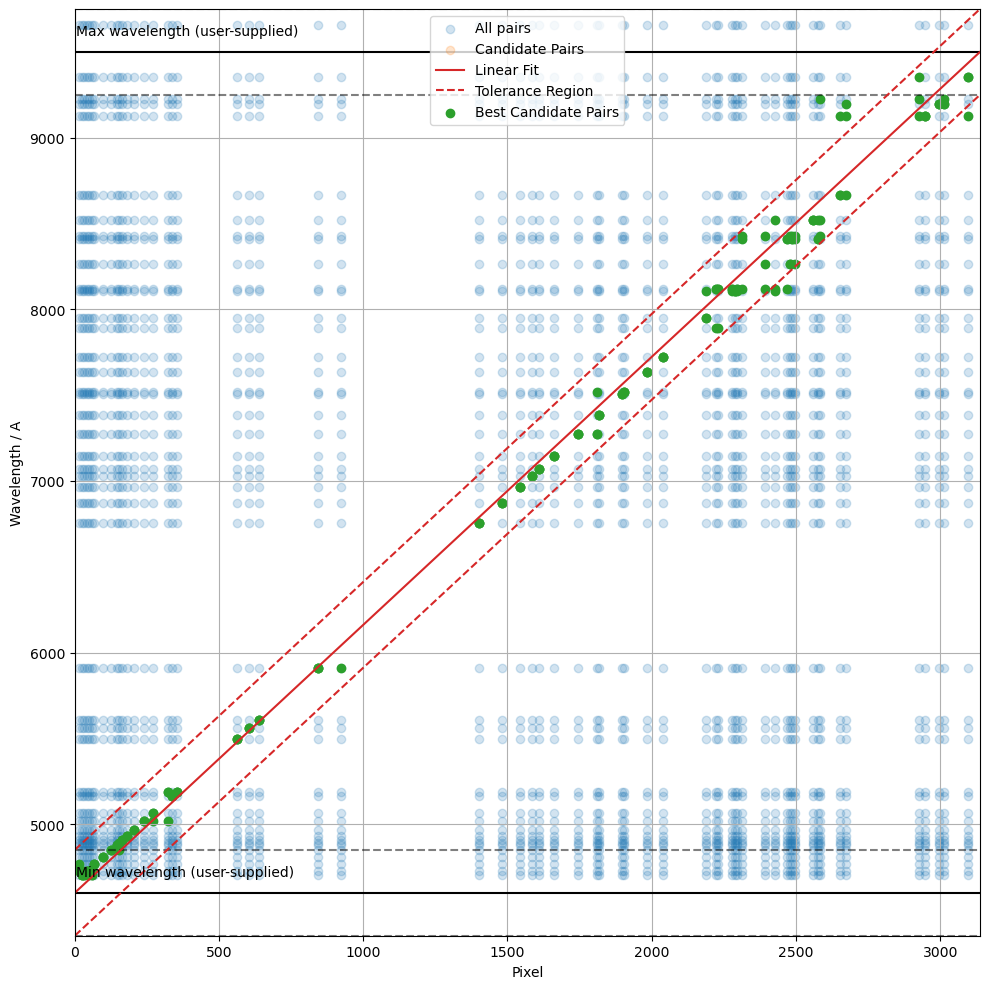

In [11]:
# Show the parameter space for searching possible solution
c.plot_search_space()

In [12]:
c.use_plotly()
c.plot_search_space(renderer='notebook')

In [13]:
print("Stdev error: {} A".format(residual.std()))
print("Peaks utilisation rate: {}%".format(peak_utilisation * 100))
print("Atlas utilisation rate: {}%".format(atlas_utilisation * 100))

Stdev error: 0.23512823707212427 A
Peaks utilisation rate: 70.0%
Atlas utilisation rate: 93.33333333333333%
